# Homework 4: Modeling Text Data

### Team Member 1:
* UNI: ds3516 
* Name: Danning Sui

### Team Member 2 [optional]:
* UNI: mz2597
* Name: Minghong Zheng


-----------
## Note 


### We comment the gridsearch code and unsuccessful models (whose scores are low), as it would take long time for travis to run the test, leading to time out problem.


--------

You can find the data here: https://data.boston.gov/dataset/vision-zero-entry

# Task1 - Data Cleaning  [10 points]

Load the data, visualize the class distribution. Clean up the target labels. Some categories have been arbitrarily split and need to be consolidated. 

In [3]:
############## Load Data ################
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.dpi"] = 300
data = pd.read_csv("Vision_Zero_Entry.csv", na_values = 99999)

In [2]:
data.isnull().sum()

X                 0
Y                 0
OBJECTID          0
GLOBALID       8534
REQUESTID        11
REQUESTTYPE       0
REQUESTDATE       0
STATUS            0
STREETSEGID       0
COMMENTS       1887
USERTYPE          0
dtype: int64

In [5]:
############### deletc NA and duplicates for the first time ##################
data_clean = data[['REQUESTTYPE', 'COMMENTS']].dropna().drop_duplicates()

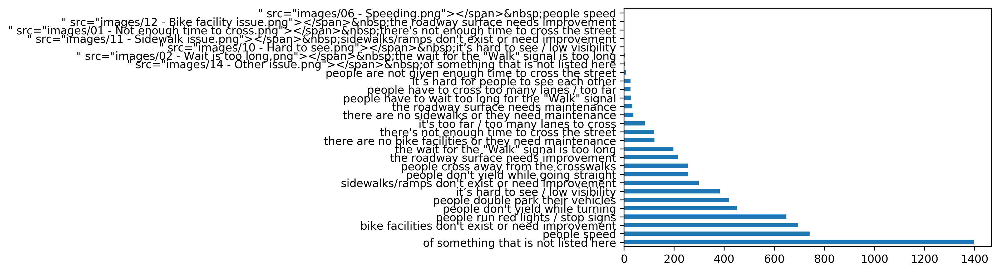

In [4]:
############### visualize the class distribution ###############
# frequency
data_clean['REQUESTTYPE'].value_counts().plot(kind='barh')

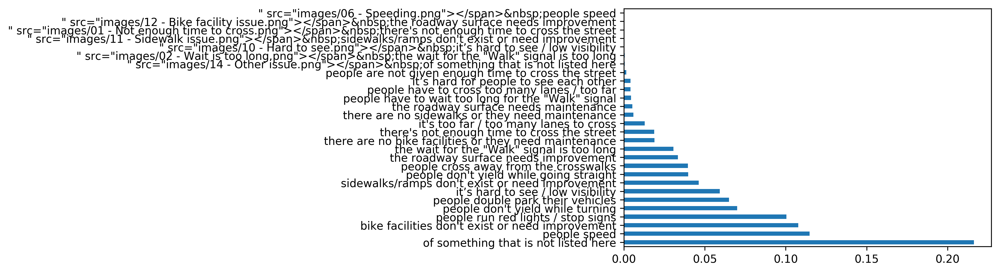

In [5]:
# percentage
(data_clean['REQUESTTYPE'].value_counts()/data_clean['REQUESTTYPE'].size).plot(kind='barh')

In [6]:
data_clean.REQUESTTYPE.unique()

array(["bike facilities don't exist or need improvement",
       'of something that is not listed here',
       "people don't yield while going straight",
       'it’s hard to see / low visibility',
       "people don't yield while turning",
       'the wait for the "Walk" signal is too long',
       "sidewalks/ramps don't exist or need improvement",
       'people cross away from the crosswalks',
       'people double park their vehicles', 'people speed',
       'people run red lights / stop signs',
       "it's too far / too many lanes to cross",
       "there's not enough time to cross the street",
       'the roadway surface needs improvement',
       'there are no bike facilities or they need maintenance',
       'the roadway surface needs maintenance',
       'people have to cross too many lanes / too far',
       'there are no sidewalks or they need maintenance',
       'it’s hard for people to see each other',
       'people have to wait too long for the "Walk" signal',
       

In [7]:
########### Clean up the target labels #####################

########### consplidate the request types with "image" to their similar type ########
pd.set_option('display.max_colwidth', -1)
data_clean[data_clean['REQUESTTYPE'].str.contains("image")]

,REQUESTTYPE,COMMENTS
469,""" src=""images/10 - Hard to see.png""></span>&nbsp;it’s hard to see / low visibility","It's very hard to see the oncoming traffic and there's lots to worry about right here, because you're also crossing train tracks."
470,""" src=""images/10 - Hard to see.png""></span>&nbsp;it’s hard to see / low visibility",Very hard to see oncoming traffic and watch out for trains at same time. Very dangerous cross-through.
2488,""" src=""images/02 - Wait is too long.png""></span>&nbsp;the wait for the ""Walk"" signal is too long",Test
3985,""" src=""images/14 - Other issue.png""></span>&nbsp;of something that is not listed here",Drivers do not stop for pedestrians in the designated crosswalks. White striped lines and yellow signs!
4092,""" src=""images/01 - Not enough time to cross.png""></span>&nbsp;there's not enough time to cross the street",The whole circle is a nightmare for pedestrians and cyclists. And motorists for that matter- although they are protected by a ton of metal. Crosswalk timing is too short to traverse the circle with trains and cars running lights and gridlock!
4137,""" src=""images/12 - Bike facility issue.png""></span>&nbsp;the roadway surface needs improvement",The crosswalks need re-striping. And drivers do not stop for pedestrians in crosswalks.
5240,""" src=""images/11 - Sidewalk issue.png""></span>&nbsp;sidewalks/ramps don't exist or need improvement","try walking from the theatre district to the other side of 95 - there are no sidewalk cuts or you have to weave back and forth, from one side of the street to the other to find one. no baby carriage or wheelchair could possible navigate this."
5708,""" src=""images/14 - Other issue.png""></span>&nbsp;of something that is not listed here","3 lanes at 899 Beacon St at Park Dr- left lane on Beacon for left turn only. Very small sign, no markings on street. Many cars in left lane go straight squeezing other 2 lanes with cars AND bikers. HEAVY TRAFFIC-VERY DANGEROUS. See this daily"
6292,""" src=""images/11 - Sidewalk issue.png""></span>&nbsp;sidewalks/ramps don't exist or need improvement",the sidewalks in front of the Roxbury Crossing T station are crumbly and are in bad need of repair
6338,""" src=""images/02 - Wait is too long.png""></span>&nbsp;the wait for the ""Walk"" signal is too long","The wait time to cross Centre Street to continue on the SW corridor park is too long and when th elight mercifully changes, it is too short to get across safely as many cars have run the light."


In [6]:
######### consolidate and delete duplicate again #######

# image
data_clean.REQUESTTYPE = (data_clean.REQUESTTYPE
                    .map(lambda x: x.split(';')[1] if len(x.split(';'))==2 else x))

# similar types merge:

# people have to cross too many lanes / too far = it's too far / too many lanes to cross
# people are not given enough time to cross the street = there's not enough time to cross the street
# the roadway surface needs maintenance = the roadway surface needs improvement
# sidewalks/ramps don't exist or need improvement = there are no sidewalks or they need maintenance
# the wait for the "Walk" signal is too long = people have to wait too long for the "Walk" signal
# bike facilities don't exist or need improvement = there are no bike facilities or they need maintenance
# it’s hard for people to see each other = it’s hard to see / low visibility

data_clean.REQUESTTYPE.replace(
    {
     "people have to cross too many lanes / too far": "it's too far / too many lanes to cross"   ,
    "people are not given enough time to cross the street" : "there's not enough time to cross the street",
    "the roadway surface needs maintenance" : "the roadway surface needs improvement",
        "sidewalks/ramps don't exist or need improvement" : "there are no sidewalks or they need maintenance",
    'the wait for the "Walk" signal is too long': 'people have to wait too long for the "Walk" signal',
    "bike facilities don't exist or need improvement" :"there are no bike facilities or they need maintenance",
     'it’s hard for people to see each other'   :'it’s hard to see / low visibility'
    }
    , inplace=True)
data_clean = data_clean.drop_duplicates()

In [9]:
data_clean.REQUESTTYPE.unique()

array(['there are no bike facilities or they need maintenance',
       'of something that is not listed here',
       "people don't yield while going straight",
       'it’s hard to see / low visibility',
       "people don't yield while turning",
       'people have to wait too long for the "Walk" signal',
       'there are no sidewalks or they need maintenance',
       'people cross away from the crosswalks',
       'people double park their vehicles', 'people speed',
       'people run red lights / stop signs',
       "it's too far / too many lanes to cross",
       "there's not enough time to cross the street",
       'the roadway surface needs improvement'], dtype=object)

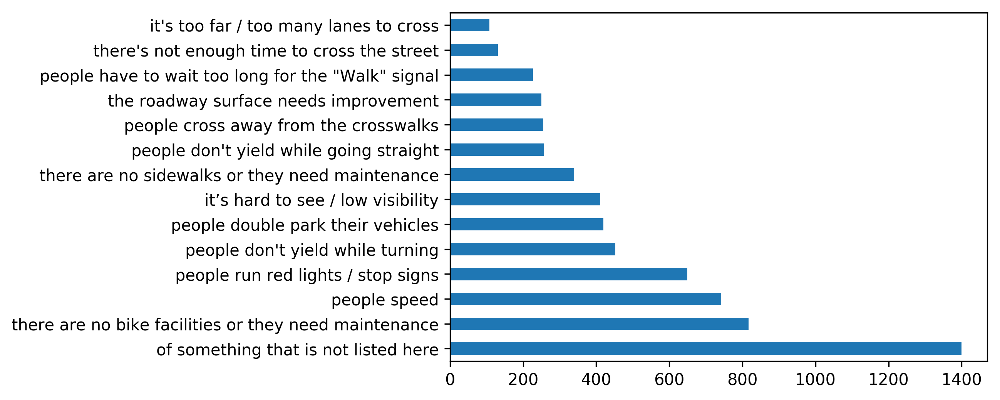

In [10]:
######## visualize the distribution after clean-up ############
# frequency
data_clean['REQUESTTYPE'].value_counts().plot(kind='barh')

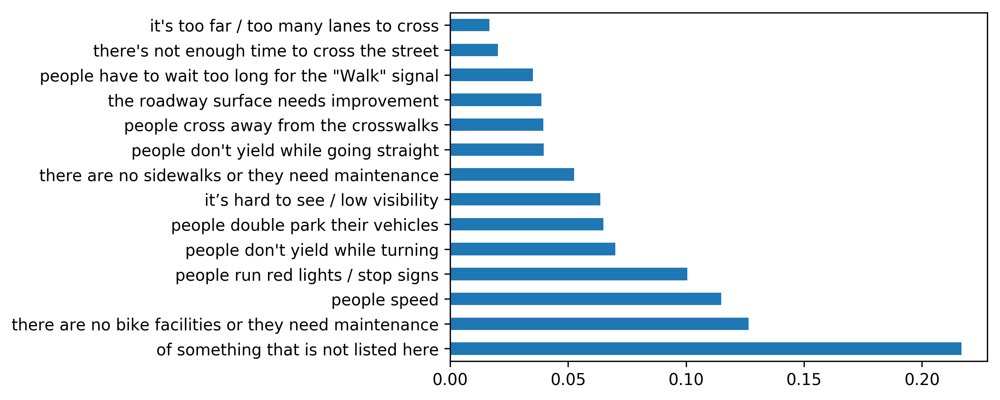

In [11]:
# percentage
(data_clean['REQUESTTYPE'].value_counts()/data_clean['REQUESTTYPE'].size).plot(kind='barh')


# Task2 - Model 1 [10 points]

Run a baseline multi-class classification model using a bag-of-word approach, report macro f1-score (should be above .5) and visualize the confusion matrix. Can you interpret the mistakes made by the model? 

In [12]:
from sklearn.model_selection import train_test_split
X_train_text, X_test_text, y_train, y_test = train_test_split(data_clean.COMMENTS, data_clean.REQUESTTYPE, stratify = data_clean.REQUESTTYPE, random_state = 0)

In [13]:
from sklearn.feature_extraction.text import CountVectorizer
vect = CountVectorizer()
X_train = vect.fit_transform(X_train_text)
X_test = vect.transform(X_test_text)

In [14]:
feature_names = vect.get_feature_names()
print(feature_names[:10])
print(feature_names[2000:2020])

['00', '00am', '02124', '10', '100', '1000', '1000s', '101', '1010', '109']
['feb', 'fed', 'fedex', 'feed', 'feedback', 'feel', 'feeling', 'feels', 'feet', 'feint', 'fell', 'fellow', 'females', 'fence', 'fenced', 'fences', 'fencing', 'fend', 'fender', 'fens']


In [15]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression().fit(X_train, y_train)
y_pred = lr.predict(X_test)

In [16]:
print(y_pred[1:10])
print('\n')
print(y_test[1:10])

['people speed' 'of something that is not listed here'
 'people run red lights / stop signs' 'people double park their vehicles'
 "there's not enough time to cross the street"
 'of something that is not listed here'
 'of something that is not listed here'
 'people run red lights / stop signs'
 'people have to wait too long for the "Walk" signal']


6317    people speed                                         
6284    there are no sidewalks or they need maintenance      
5899    people run red lights / stop signs                   
4105    people double park their vehicles                    
4454    there's not enough time to cross the street          
1963    there are no bike facilities or they need maintenance
4469    of something that is not listed here                 
1021    of something that is not listed here                 
5981    people have to wait too long for the "Walk" signal   
Name: REQUESTTYPE, dtype: object


In [17]:
############## f1-score ##############
from sklearn.metrics import f1_score
f1_score_model_1 = f1_score(y_test, y_pred, average='macro')
f1_score_model_1

0.53924765983862044

In [18]:
from sklearn.metrics import confusion_matrix
confusion_unnormalized = confusion_matrix(y_test, y_pred,labels=[i for i in y_test.unique()])

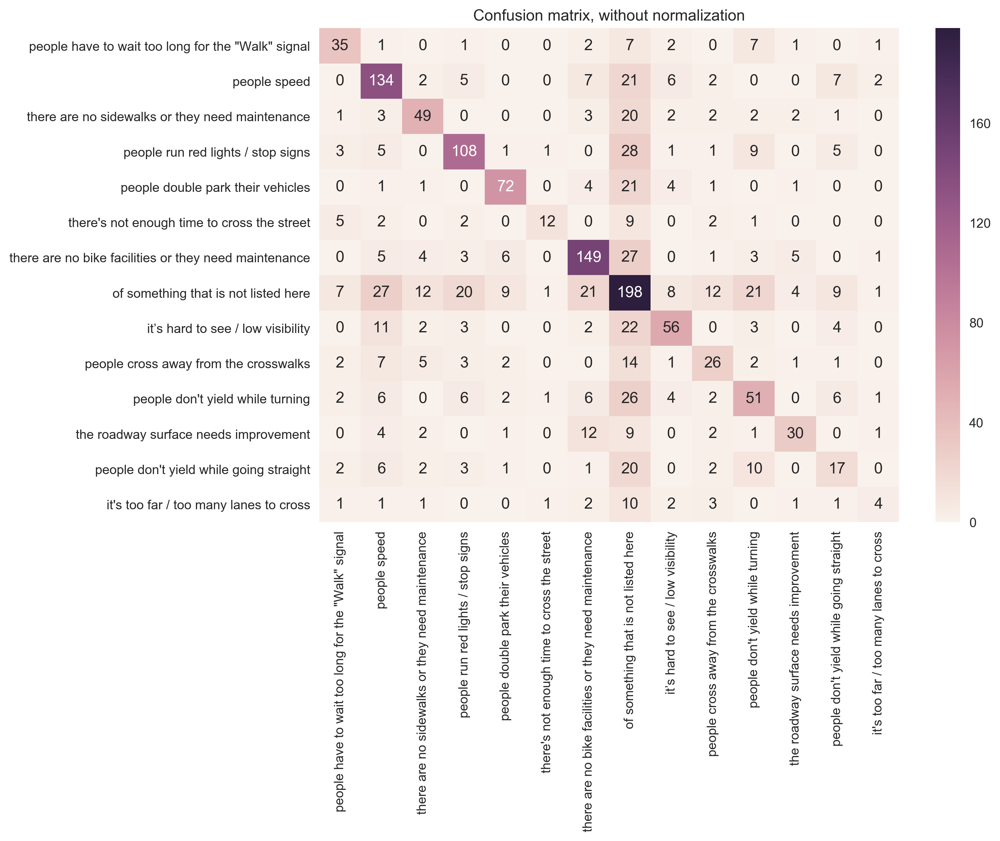

In [23]:
import seaborn as sn

df_confusion_unnormalized = pd.DataFrame(confusion_unnormalized, index = [i for i in y_test.unique()],
                  columns = [i for i in y_test.unique()])
plt.figure(figsize = (10,7))
plt.title('Confusion matrix, without normalization')
sn.heatmap(df_confusion_unnormalized, annot=True,fmt="d")

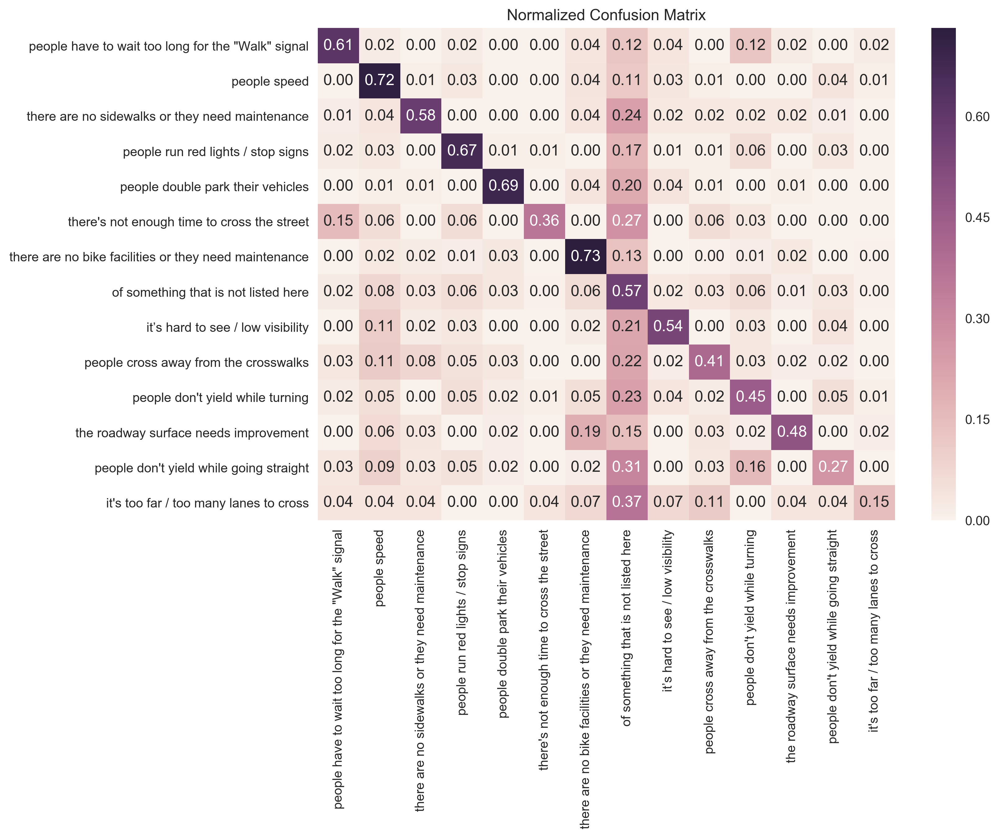

In [21]:
confusion_normalized = confusion_unnormalized.astype('float') / confusion_unnormalized.sum(axis=1)[:, np.newaxis]
df_confusion_normalized = pd.DataFrame(confusion_normalized, index = [i for i in y_test.unique()],
                  columns = [i for i in y_test.unique()])
plt.figure(figsize = (10,7))
plt.title('Normalized Confusion Matrix')
sn.heatmap(df_confusion_normalized, annot=True,fmt='.2f')

### Drawbacks of "Bag of Words" Model
* Bag of words completely removes word order.
* It only considers single words, which may misunderstand the real meaning behind the words, for example “didn’t love” and “love” are very different.
* Since some words appear more frequently in general(i.e. a, the), without doing tfi_df or stop_words may mislead the result.
* We haven’t used the best parameter for logistic regression, which can make the f1_score not so high
* It only looks at the word string instead of the characters, which may creates new bags of words due to misspelling.

# Task3 - Model 2 [30 points]

Improve the model using more complex text features, including n-grams, character n-grams and possibly domain-specific features.

## 1 n-grams

In [9]:
# ########## tuning parameters with "dfi_df" ############

# from sklearn.model_selection import GridSearchCV
# from sklearn.linear_model import LogisticRegression
# from sklearn.feature_extraction.text import TfidfVectorizer, TfidfTransformer
# from sklearn.preprocessing import Normalizer
# from sklearn.pipeline import make_pipeline

# param_grid = {"tfidftransformer" : [None, TfidfTransformer()],
#               "logisticregression__C": [100, 10, 1, 0.1, 0.001],
#               "countvectorizer__ngram_range":[(1,1),(1,2),(1,3),(1,4),(1,5),
#                                              (2,2),(2,3),(2,4),(2,5)],
#               "countvectorizer__min_df":[1,2,3,4,5,6]}
# grid_dfi = GridSearchCV(make_pipeline(CountVectorizer(), TfidfTransformer(), LogisticRegression()),
#                    param_grid=param_grid, cv = 10, scoring= "f1_macro")

In [156]:
# grid_dfi.fit(X_train_text, y_train)

/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in l

GridSearchCV(cv=10, error_score='raise',
       estimator=Pipeline(steps=[('countvectorizer', CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), preprocessor=None, stop_words=None,
  ...ty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False))]),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'tfidftransformer': [None, TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True)], 'countvectorizer__min_df': [1, 2, 3, 4, 5, 6], 'countvectorizer__ngram_range': [(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (2, 2), (2, 3), (2, 4), (2, 5)], 'logisticregression__C': [100, 10, 1, 0.1, 0.001]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='f1_macro', verbose=0)

In [157]:
# grid_dfi.best_score_

0.54410045205395186

In [158]:
# grid_dfi.best_params_

{'countvectorizer__min_df': 1,
 'countvectorizer__ngram_range': (1, 2),
 'logisticregression__C': 100,
 'tfidftransformer': TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True)}

In [206]:
# #### +heatmap ########
# results_dfi = pd.DataFrame(grid_dfi.cv_results_)
# res_pivot_dfi = results_dfi.pivot_table(values=['mean_test_score', 'mean_train_score'],index=["param_countvectorizer__ngram_range", "param_logisticregression__C",
#                                        "param_countvectorizer__min_df"])
# bla = res_pivot_dfi.mean_test_score.unstack(["param_countvectorizer__ngram_range"])
# bla = bla.swaplevel().sort_index()
# bla.index.names = [ 'C','min_df']
# bla.style.background_gradient(cmap="viridis")

In [24]:
############# validation #########
from sklearn.feature_extraction.text import TfidfVectorizer, TfidfTransformer
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import make_pipeline

pipe_dfi = make_pipeline(CountVectorizer(ngram_range=(1, 2)),
                         TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True),
                         LogisticRegression(C=100))
pipe_dfi.fit(X_train_text, y_train)
y_pred_dfi = pipe_dfi.predict(X_test_text)
f1_score_model_2 = f1_score(y_test, y_pred_dfi, average='macro')
f1_score_model_2

0.56024396242535157

Here we can see the score has improved. We would compare it with **`stop_words`** later.

In [194]:
########## tuning parameters without "stop_words" ############

# from sklearn.model_selection import GridSearchCV
# from sklearn.linear_model import LogisticRegression
# from sklearn.preprocessing import Normalizer
# from sklearn.pipeline import make_pipeline

# param_grid = {"logisticregression__C": [100, 10, 1, 0.1, 0.001],
#               "countvectorizer__ngram_range":[(1,1),(1,2),(1,3),(1,4),(1,5),
#                                              (2,2),(2,3),(2,4),(2,5)],
#               "countvectorizer__min_df":[1,2,3,4,5,6]}
# grid_stop = GridSearchCV(make_pipeline(CountVectorizer(), LogisticRegression()),
#                    param_grid=param_grid, cv = 10, scoring= "f1_macro")

In [195]:
# grid_stop.fit(X_train_text, y_train)

/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in l

GridSearchCV(cv=10, error_score='raise',
       estimator=Pipeline(steps=[('countvectorizer', CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), preprocessor=None, stop_words=None,
  ...ty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False))]),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'countvectorizer__min_df': [1, 2, 3, 4, 5, 6], 'countvectorizer__ngram_range': [(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (2, 2), (2, 3), (2, 4), (2, 5)], 'logisticregression__C': [100, 10, 1, 0.1, 0.001]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='f1_macro', verbose=0)

In [196]:
# grid_stop.best_score_

0.5370135181464688

In [197]:
# grid_stop.best_params_

{'countvectorizer__min_df': 2,
 'countvectorizer__ngram_range': (1, 5),
 'logisticregression__C': 1}

In [198]:
# results_stop = pd.DataFrame(grid_stop.cv_results_)
# res_pivot_stop = results_stop.pivot_table(values=['mean_test_score', 'mean_train_score'],index=["param_countvectorizer__ngram_range", "param_logisticregression__C",
#                                        "param_countvectorizer__min_df"])

In [199]:
# bla = res_pivot_stop.mean_test_score.unstack(["param_countvectorizer__ngram_range"])
# bla = bla.swaplevel().sort_index()
# bla.index.names = [ 'C','min_df']
# bla.style.background_gradient(cmap="viridis")

In [201]:
# ####### validate the params without stop_words #######
# y_pred_stop = grid_stop.predict(X_test_text)
# f1_score(y_test, y_pred_stop, average='macro')

0.53926654367070048

In [25]:
######### test whether stop_words can improve ########
pipe_stop = make_pipeline(CountVectorizer(stop_words='english',min_df=2,ngram_range=(1, 5)),LogisticRegression(C=1))
X_train_stop = pipe_stop.fit(X_train_text,y_train)
y_pred_stop = pipe_stop.predict(X_test_text)
f1_score(y_test, y_pred_stop, average='macro')

0.55232456073003855

**`stop_words`** has improved the performance. Also we can see that f1 score of **`dfi_df`** is higher *(0.56)* than the **`stop_words`** *(0.55)*.

We further normalize the data using different methods.

The default normalizer of `CountVectorizer` is **`lower-case`**, and the f1 score is:

* dfi_df : 0.56024 
* stop_words : 0.55232

In [26]:
######### normalization 1: Normalizer #########
pipe_dfi_normalizer = make_pipeline(CountVectorizer(ngram_range=(1, 2)),
                         TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True),
                        Normalizer(), LogisticRegression(C=100))
pipe_dfi_normalizer.fit(X_train_text,y_train)
y_pred_dfi_normalizer = pipe_dfi_normalizer.predict(X_test_text)

pipe_stop_normalizer = make_pipeline(CountVectorizer(min_df=2,ngram_range=(1, 5), stop_words='english'),
                         Normalizer(), LogisticRegression(C=1))
pipe_stop_normalizer.fit(X_train_text,y_train)
y_pred_stop_normalizer = pipe_stop_normalizer.predict(X_test_text)



print("dfi_df + Normalizer:", f1_score(y_test, y_pred_dfi_normalizer, average="macro"))
print("stop_words + Normalizer:", f1_score(y_test, y_pred_stop_normalizer, average="macro"))

/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/utils/validation.py:429: DataConversionWarning: Data with input dtype int64 was converted to float64 by the normalize function.
  warnings.warn(msg, _DataConversionWarning)


dfi_df + Normalizer: 0.560243962425
stop_words + Normalizer: 0.52277245534


/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


**`Normalizer()`** seems not to have much influence on data. So we need to try other ways.

In [27]:
######### normalization 2: Stem #########
from nltk.stem.snowball import EnglishStemmer
from sklearn.metrics import f1_score

stemmer = EnglishStemmer()
analyzer = CountVectorizer().build_analyzer()

def stemmed_words(doc):
    return (stemmer.stem(w) for w in analyzer(doc))

pipe_dfi_stem = make_pipeline(CountVectorizer(analyzer=stemmed_words, ngram_range=(1, 2)),
                         TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True), LogisticRegression(C=100))
pipe_dfi_stem.fit(X_train_text,y_train)
y_pred_dfi_stem = pipe_dfi_stem.predict(X_test_text)

pipe_stop_stem = make_pipeline(CountVectorizer(analyzer=stemmed_words, min_df=2,ngram_range=(1, 5), stop_words='english'),
                          LogisticRegression(C=1))
pipe_stop_stem.fit(X_train_text,y_train)
y_pred_stop_stem = pipe_stop_stem.predict(X_test_text)


print("dfi_df + stem:", f1_score(y_test, y_pred_dfi_stem, average="macro"))
print("stop_words + stem:", f1_score(y_test, y_pred_stop_stem, average="macro"))

dfi_df + stem: 0.473380117981
stop_words + stem: 0.538954726098


In [24]:
# import nltk
# nltk.download()

showing info https://raw.githubusercontent.com/nltk/nltk_data/gh-pages/index.xml


True

In [29]:
######### normalization 1: Lemmatization #########
# from nltk import word_tokenize          
# from nltk.stem import WordNetLemmatizer 
# class LemmaTokenizer(object):
#     def __init__(self):
#         self.wnl = WordNetLemmatizer()
#     def __call__(self, doc):
#         return [self.wnl.lemmatize(t) for t in word_tokenize(doc)]
    
# pipe_dfi_lem = make_pipeline(CountVectorizer(tokenizer=LemmaTokenizer(), ngram_range=(1, 2)),
#                          TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True), LogisticRegression(C=100))
# pipe_dfi_lem.fit(X_train_text,y_train)
# y_pred_dfi_lem = pipe_dfi_lem.predict(X_test_text)

# pipe_stop_lem = make_pipeline(CountVectorizer(tokenizer=LemmaTokenizer(), min_df=2,ngram_range=(1, 5), stop_words='english'),
#                           LogisticRegression(C=1))
# pipe_stop_lem.fit(X_train_text,y_train)
# y_pred_stop_lem = pipe_stop_lem.predict(X_test_text)



# print("dfi_df + lem:", f1_score(y_test, y_pred_dfi_lem, average="macro"))
# print("stop_words + lem:", f1_score(y_test, y_pred_stop_lem, average="macro"))

dfi_df + lem: 0.55645508699
stop_words + lem: 0.547882700812


Finally we can see that among these normalization methods, **`lemmatization`** has the best performance, but it still hasn't acheived the highest score 0.56. so for this part, our final improved model for "n-grams" is the `dfi_df` with parameters.

The parameters are :
* 'countvectorizer__ngram_range': (1, 2),
* 'logisticregression__C': 100,
* 'tfidftransformer': TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True)
                       
And the test f1 score is : 0.56024

## 2 character n-grams

In [224]:
# ########## tuning parameters without "stop_words" ############
# from sklearn.model_selection import GridSearchCV
# from sklearn.linear_model import LogisticRegression
# from sklearn.preprocessing import Normalizer
# from sklearn.pipeline import make_pipeline

# param_grid = {"logisticregression__C": [100, 10, 1, 0.1, 0.001],
#               "countvectorizer__ngram_range":[(1,1),(1,2)],
#               "countvectorizer__min_df":[1,2,4]}
# grid = GridSearchCV(make_pipeline(CountVectorizer(analyzer="char"), 
#                                   Normalizer(), LogisticRegression()),
#                    param_grid=param_grid, cv = 10, scoring= "f1_macro")

In [225]:
# grid.fit(X_train_text, y_train)

/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/utils/validation.py:429: DataConversionWarning: Data with input dtype int64 was converted to float64 by the normalize function.
  warnings.warn(msg, _DataConversionWarning)
/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/utils/validation.py:429: DataConversionWarning: Data with input dtype int64 was converted to float64 by the normalize function.
  warnings.warn(msg, _DataConversionWarning)
/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicte

GridSearchCV(cv=10, error_score='raise',
       estimator=Pipeline(steps=[('countvectorizer', CountVectorizer(analyzer='char', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), preprocessor=None, stop_words=None,
  ...ty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False))]),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'countvectorizer__min_df': [1, 2, 4], 'countvectorizer__ngram_range': [(1, 1), (1, 2)], 'logisticregression__C': [100, 10, 1, 0.1, 0.001]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='f1_macro', verbose=0)

In [226]:
# grid.best_score_

0.46726157653203204

In [227]:
# grid.best_params_

{'countvectorizer__min_df': 2,
 'countvectorizer__ngram_range': (1, 2),
 'logisticregression__C': 100}

In [228]:
# results = pd.DataFrame(grid.cv_results_)
# res_pivot = results.pivot_table(values=['mean_test_score', 'mean_train_score'],
#                                 index=["param_countvectorizer__ngram_range", "param_logisticregression__C",
#                                        "param_countvectorizer__min_df"])

In [229]:
# res_pivot.mean_test_score

param_countvectorizer__ngram_range  param_logisticregression__C  param_countvectorizer__min_df
(1, 1)                              0.001                        1                                0.025445
                                                                 2                                0.025445
                                                                 4                                0.025445
                                    0.100                        1                                0.048076
                                                                 2                                0.048076
                                                                 4                                0.048076
                                    1.000                        1                                0.124246
                                                                 2                                0.124246
                                                 

In [231]:
# bla = res_pivot.mean_test_score.unstack(["param_countvectorizer__ngram_range"])
# bla = bla.swaplevel().sort_index()
# bla.index.names = ['min_df', 'C']
# bla.style.background_gradient(cmap="viridis")

Here we can see the basic model of char-ngram has much lower score than the ngram. Even the best is only 0.46726157653203204. So we decide not to further tune it with parameters.

## 3 domain-specific features

In [30]:
# from nltk.sentiment.vader import SentimentIntensityAnalyzer
# domain = data_clean

# X_df = pd.DataFrame(domain.COMMENTS)
# X_df['len'] = domain.COMMENTS.map(lambda s: len(s.split()))
# X_df['punctuation'] = domain.COMMENTS.map(lambda s: int("!" in s))
# X_df

/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


,COMMENTS,len,punctuation
0,Broadway Bridge is wide & off highway ramps. Vehicles speed over. Key connection for bikes (& everyone) to get back into Southie fr much of city. W.Broadway is wide enough for bike lanes all the way across this bridge down to at least E.Broadway.,44,0
1,"This intersection is dangerous. Cars don't follow the lane markings (ie go straight while in turn lane) so it's nearly impossible to safely position yourself on a bike. In a car, people are trying to move over/it's unclear where people are going.",42,0
2,"It's terrifying to walk over here. It seems like it's impossible to get the cars to stop stop, even at the crosswalks.",22,0
3,cars coming around the corner of this wide one street are speeding and not visible for persons on the crosswalk,20,0
4,"as you come off the bike path, it's unclear how to get across to continue south on Washington, and cars turn right into your path as you try to cross west with traffic to position yourself to go south with traffic.",41,0
8,This intersection is very confusing.,5,0
9,people walking go against the light because we have to wait too long,13,0
11,Getting from the T stop to the pedestrian bridge/esplanade takes 3 light cycles.,13,0
12,"I will be coming down to the intersection along Belgrade, and cars who would/should yield to a car going straight, will turn in front of me, or alongside me.",29,0
13,"This is a crosswalk by a school, and there is no curb-cut to the sidewalk at the North end. I can't easily get up or down with a trailer, or child on the back of the bike. This would be an issue for anyone in a wheelchair too.",48,0


In [31]:
# domain.index = range(len(domain))

In [32]:
# from nltk.sentiment.vader import SentimentIntensityAnalyzer
# feature_list = [[] for _ in range(len(domain.COMMENTS))]
# sid = SentimentIntensityAnalyzer()     
# for i in range(len(domain.COMMENTS)):
#     ss = sid.polarity_scores(domain.COMMENTS[i])
#     for k in sorted(ss):
#         feature_list[i].append(ss[k])
#     feature_list[i].append(X_df.iloc[i]['len'])
#     feature_list[i].append(X_df.iloc[i]['punctuation'])

In [33]:
# y_domain = data_clean.REQUESTTYPE
# y_domain.index = range(len(domain))

In [34]:
# X_domain = np.array(feature_list)

In [35]:
# from sklearn.model_selection import train_test_split
# X_train_domain, X_test_domain, y_train_domain, y_test_domain = train_test_split(X_domain, y_domain, stratify = y_domain, random_state = 0)

In [36]:
# from sklearn.metrics import f1_score
# from sklearn.ensemble import GradientBoostingClassifier
# gbc = GradientBoostingClassifier()
# gbc.fit(X_train_domain, y_train_domain)
# y_pred_domain = gbc.predict(X_test_domain)
# f1_score(y_test_domain, y_pred_domain, average='macro')

0.076995593852491245

Here we found the f1_score is rather low. We may need other strategy and feature selection techniques for the domain specific features.

# Task4 - Visualize Results [10 points]

Visualize results of the tuned model (classification results, confusion matrix, important features, example mistakes).

In [37]:
####### model here #############
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer, TfidfTransformer
from sklearn.pipeline import make_pipeline

pipe = make_pipeline(CountVectorizer(ngram_range=(1, 2)),
                         TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True), LogisticRegression(C=100))
pipe.fit(X_train_text, y_train)
y_pred = pipe.predict(X_test_text)

#### classification results

In [38]:
from sklearn.metrics import classification_report
target_names = data_clean.REQUESTTYPE.unique()
print(classification_report(y_test, y_pred, target_names=target_names))

                                                       precision    recall  f1-score   support

there are no bike facilities or they need maintenance       0.40      0.07      0.12        27
                 of something that is not listed here       0.69      0.59      0.64       103
              people don't yield while going straight       0.48      0.61      0.54       350
                    it’s hard to see / low visibility       0.47      0.44      0.45        64
                     people don't yield while turning       0.42      0.22      0.29        64
   people have to wait too long for the "Walk" signal       0.55      0.48      0.51       113
      there are no sidewalks or they need maintenance       0.81      0.76      0.78       105
                people cross away from the crosswalks       0.69      0.74      0.71        57
                    people double park their vehicles       0.67      0.72      0.69       162
                                         people s

#### confusion matrix

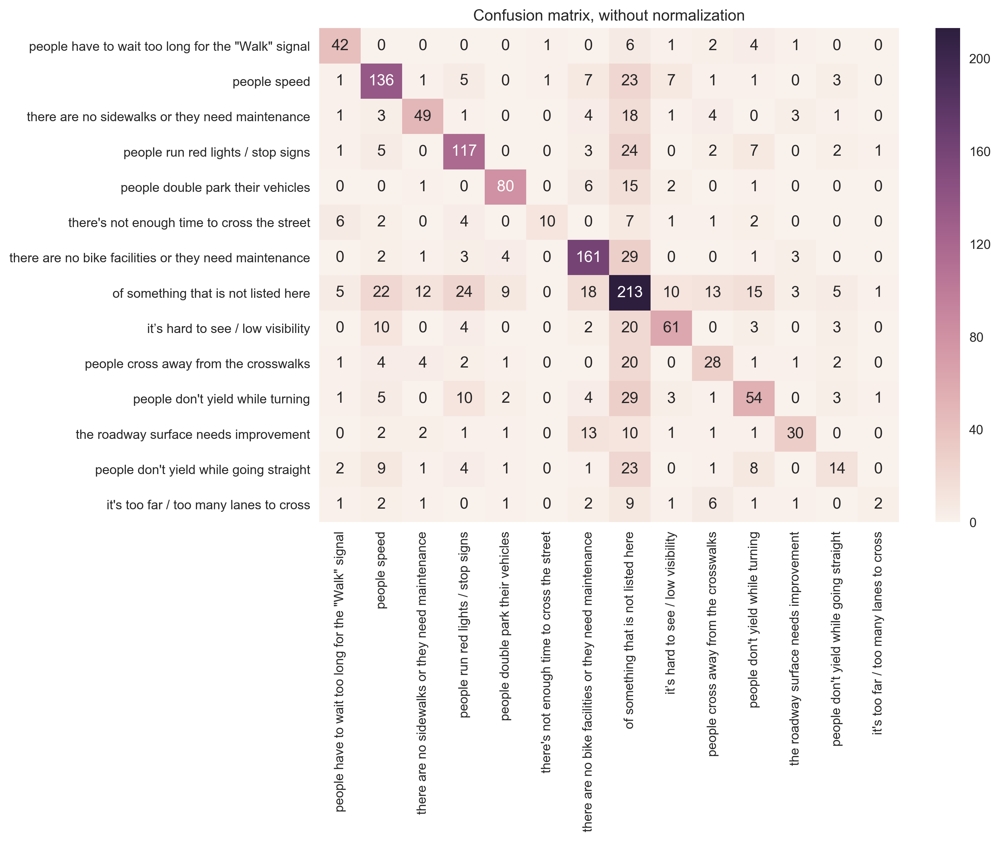

In [39]:
import seaborn as sn
from sklearn.metrics import confusion_matrix

confusion_unnormalized = confusion_matrix(y_test, y_pred,labels=[i for i in y_test.unique()])
df_confusion_unnormalized = pd.DataFrame(confusion_unnormalized, index = [i for i in y_test.unique()],
                  columns = [i for i in y_test.unique()])
plt.figure(figsize = (10,7))
plt.title('Confusion matrix, without normalization')
sn.heatmap(df_confusion_unnormalized, annot=True,fmt="d")

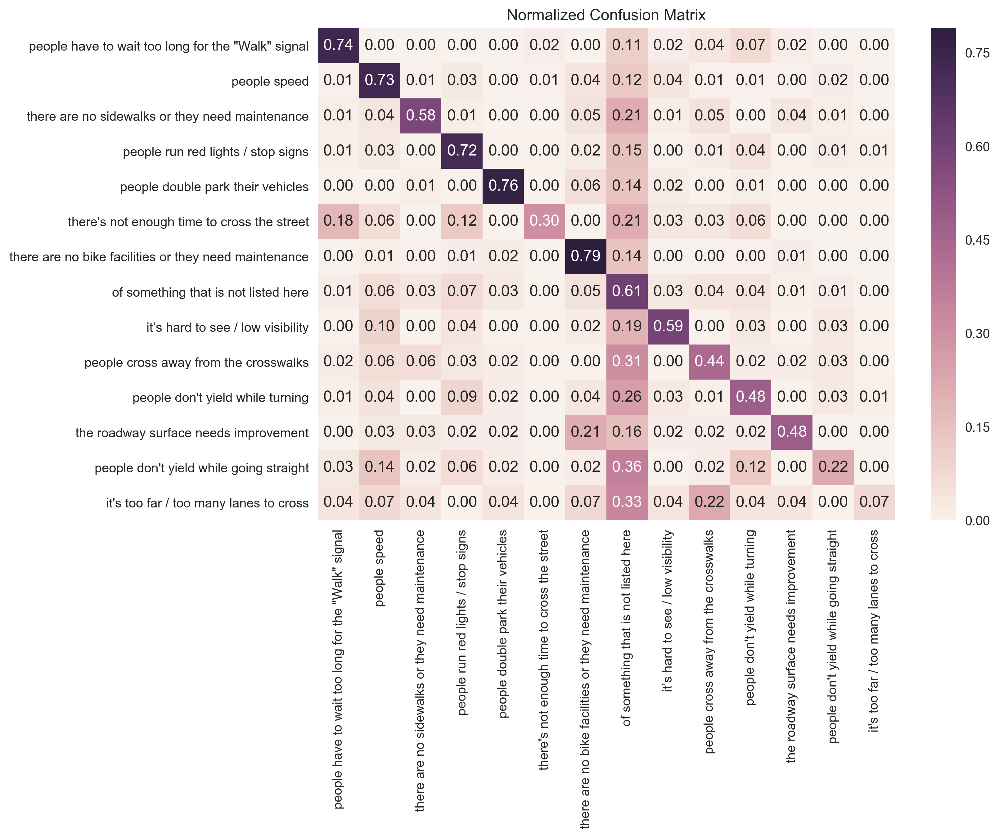

In [40]:
confusion_normalized = confusion_unnormalized.astype('float') / confusion_unnormalized.sum(axis=1)[:, np.newaxis]
df_confusion_normalized = pd.DataFrame(confusion_normalized, index = [i for i in y_test.unique()],
                  columns = [i for i in y_test.unique()])
plt.figure(figsize = (10,7))
plt.title('Normalized Confusion Matrix')
sn.heatmap(df_confusion_normalized, annot=True,fmt='.2f')

#### important features

In [41]:
def plot_important_features(coef, feature_names, top_n=20, ax=None):
    if ax is None:
        ax = plt.gca()
    inds = np.argsort(np.abs(coef))[-top_n:]
    important_coefs = coef[inds]
    sort_sign = np.argsort(important_coefs)
    myrange = range(len(inds))
    combined_inds = inds[sort_sign]

    ax.bar(myrange, coef[combined_inds])
    ax.set_xticks(myrange)
    ax.set_xticklabels(feature_names[combined_inds], rotation=60, ha="right")

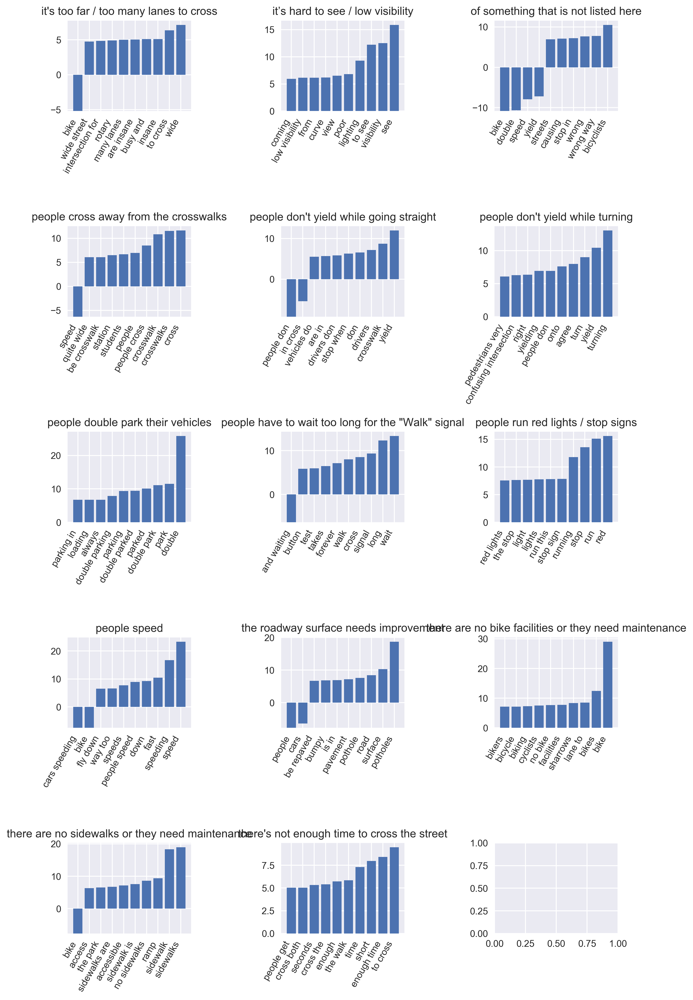

In [42]:
lr = pipe.named_steps['logisticregression']
feature_names = np.array(pipe.named_steps['countvectorizer'].get_feature_names())
n_classes = len(lr.classes_)
fig, axes = plt.subplots(n_classes // 3 + 1, 3, figsize=(10, 15))
for ax, coef, label in zip(axes.ravel(), lr.coef_, lr.classes_):
    ax.set_title(label)
    plot_important_features(coef, feature_names, top_n=10, ax=ax)
    
plt.tight_layout()

#### example mistakes

In [43]:
####### example 1 ###########
sum(y_test[y_pred == "of something that is not listed here"] == "people don't yield while turning")

29

Here we can see from the confusion matrix that the highest frequency mistake is that the model predict comments with true label "people don't yield while turning" into "of something that is not listed here" category. This may be because there are too many records from "of something that is not listed here" label in y_train.

In [44]:
####### example 2 ###########
sum(y_test[y_pred == "of something that is not listed here"] == "people run red lights / stop signs")

24

Also, there are 24 (second highest) wrongly predicted records labeled as "of something that is not listed here", while their true labels are "people run red lights / stop signs". Similarly, this may be because too many similar COMMENTS content lead them to those similar records labeled as "of something that is not listed here".

# Task5 - Clustering [10 points]

Apply LDA, NMF and K-Means to the whole dataset. Can you find clusters or topics that match well with some of the ground truth labels? Use ARI to compare the methods and visualize topics and clusters.

## NMF
### scaled

In [45]:
X=data_clean.COMMENTS
y=data_clean.REQUESTTYPE

In [76]:
y.unique()

array(['there are no bike facilities or they need maintenance',
       'of something that is not listed here',
       "people don't yield while going straight",
       'it’s hard to see / low visibility',
       "people don't yield while turning",
       'people have to wait too long for the "Walk" signal',
       'there are no sidewalks or they need maintenance',
       'people cross away from the crosswalks',
       'people double park their vehicles', 'people speed',
       'people run red lights / stop signs',
       "it's too far / too many lanes to cross",
       "there's not enough time to cross the street",
       'the roadway surface needs improvement'], dtype=object)

In [77]:
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import Normalizer

scaler = MaxAbsScaler()
vect=make_pipeline(CountVectorizer(analyzer=stemmed_words,min_df=4,ngram_range=(1, 2)))
X1= vect.fit_transform(X)
X_scaled = scaler.fit_transform(X1)
X_normalized = Normalizer().fit_transform(X1)

/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/utils/validation.py:429: DataConversionWarning: Data with input dtype int64 was converted to float64 by the normalize function.
  warnings.warn(msg, _DataConversionWarning)


###  with tfidf

In [78]:
from sklearn.feature_extraction.text import TfidfTransformer
vect=make_pipeline(CountVectorizer(analyzer=stemmed_words,min_df=4,ngram_range=(1, 2)),TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True))
X1= vect.fit_transform(X)

In [123]:
########### compare the models by ARI score ###########
# from sklearn.feature_extraction.text import CountVectorizer
# from sklearn.cluster import KMeans
# from sklearn.decomposition import NMF
# from sklearn.metrics import adjusted_rand_score
# from sklearn.decomposition import LatentDirichletAllocation

# ari_kms = []
# ari_nmfs_scaleds = []
# ari_nmf_tfidfs=[]
# ari_ldas=[]

# for i in range(1, 30):
#     km = KMeans(n_clusters=i,random_state=3).fit(X1)
#     nmf_scale = NMF(n_components=i, verbose=10, tol=0.01).fit(X_scaled)
#     nmf_tfidf = NMF(n_components=i, verbose=10, tol=0.01).fit(X1)
#     lda = LatentDirichletAllocation(n_topics=i, learning_method="batch",topic_word_prior=1e-5).fit(X1)

#     ari_km = adjusted_rand_score(y,km.labels_)
#     ari_nmf = adjusted_rand_score(y, nmf_scale.transform(X_scaled).argmax(axis=1))
#     ari_nmf_tfidf10=adjusted_rand_score(y, nmf_tfidf.transform(X1).argmax(axis=1))
#     ari_lda=adjusted_rand_score(y, lda.transform(X1).argmax(axis=1))
   
    
#     ari_kms.append(ari_km)
#     ari_nmfs_scaleds.append(ari_nmf)
#     ari_nmf_tfidfs.append(ari_nmf_tfidf10)
#     ari_ldas.append(ari_lda)

violation: 1.0
violation: 0.07212578657106616
violation: 0.005339409238852526
Converged at iteration 3
violation: 1.0
violation: 0.07874763684512949
violation: 0.006339227494189152
Converged at iteration 3
violation: 1.0
violation: 1.866354006235669e-17
Converged at iteration 2
violation: 1.0
violation: 2.0926033002501994e-17
Converged at iteration 2
violation: 1.0
violation: 0.792143674167733
violation: 0.5233596613820728
violation: 0.3853891090531582
violation: 0.2921171330753462
violation: 0.23788949426242847
violation: 0.20895782412964134
violation: 0.18826801772895876
violation: 0.1717471688127255
violation: 0.15883372309573607
violation: 0.1472196995817032
violation: 0.136016569039703
violation: 0.12567136569067394
violation: 0.11596866206086266
violation: 0.1072828235790212
violation: 0.09934505011340293
violation: 0.09240726052712357
violation: 0.08616210983171141
violation: 0.08030593247539834
violation: 0.07486314243464552
violation: 0.07001765790234217
violation: 0.065639010

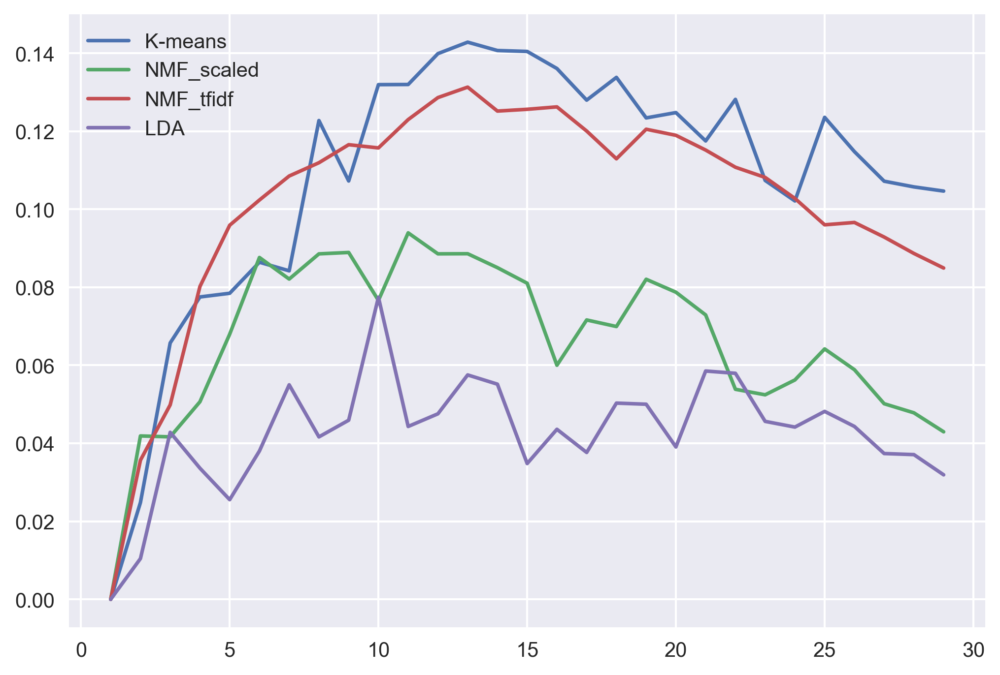

In [124]:
# plt.plot(range(1,30),ari_kms, label="K-means")
# plt.plot(range(1,30),ari_nmfs_scaleds, label="NMF_scaled")
# plt.plot(range(1,30),ari_nmf_tfidfs, label="NMF_tfidf")
# plt.plot(range(1,30),ari_ldas, label="LDA")
# plt.legend()

### Best cluster

In [167]:
# (np.argsort(ari_kms)[-1] + 1)

13

Here according to the ari score, we find that the 13-cluster kmeans model matches the ground truth (which is our true label "REQUESTTYPE") the best.

### Visualize
#### LDA

In [79]:
def print_topics(topics, feature_names, components, topics_per_chunk=6,
                 n_words=20):
    sorting = np.argsort(components, axis=1)[:, ::-1]
    for i in range(0, len(topics), topics_per_chunk):
        # for each chunk:
        these_topics = topics[i: i + topics_per_chunk]
        # maybe we have less than topics_per_chunk left
        len_this_chunk = len(these_topics)
        # print topic headers
        print(("topic {:<8}" * len_this_chunk).format(*these_topics))
        print(("-------- {0:<5}" * len_this_chunk).format(""))
        # print top n_words frequent words
        for i in range(n_words):
            try:
                print(("{:<14}" * len_this_chunk).format(
                    *feature_names[sorting[these_topics, i]]))
            except:
                pass
        print("\n")

In [81]:
from sklearn.cluster import KMeans
from sklearn.decomposition import NMF
from sklearn.metrics import adjusted_rand_score
from sklearn.decomposition import LatentDirichletAllocation

lda = LatentDirichletAllocation(n_topics=10, learning_method="batch",topic_word_prior=1e-5).fit(X1)

X_lda = lda.transform(X1)
sorting = np.argsort(lda.components_, axis=1)[:, ::-1]
print_topics(np.argsort(X_lda.sum(axis=0))[::-1][:30], feature_names, sorting, topics_per_chunk=8)

topic 7       topic 6       topic 8       topic 9       topic 4       topic 1       topic 0       topic 5       
--------      --------      --------      --------      --------      --------      --------      --------      
adhere        2nd they      alfred to     after the     abide by      abrupt stop   across all    aggressivley turn
access clarendon10am restrictionabout cars    802           along riverwayalso short    almost do     accessing     
allowing thoseall transportationallows people all points    6pm never     adjacent lot  all the       allotted time 
allowing silverall traffic   abomination   all perhaps   alleviate thisadjusted just about feet    allotted by   
allowing sidewalkall too       abruptly and  all pedestriansalleviate manyadjacent lane all that      allotted      
allowing pedestriansall to        allows parkingall pedestrianalleviate     8am           all summer    accessible crosswalk
allowing pedestrianall times     allows for    all ped       ability

In [82]:
np.argsort(X_lda.sum(axis=0))

array([3, 2, 5, 0, 1, 4, 9, 8, 6, 7])

#### NMF_scaled

violation: 1.0
violation: 0.4663010530157796
violation: 0.30279106406414363
violation: 0.2146491094993738
violation: 0.16512101060218562
violation: 0.1342954944801031
violation: 0.11290902755464566
violation: 0.09685558042273221
violation: 0.08140010179094394
violation: 0.07054595449050118
violation: 0.061572697574330426
violation: 0.05564866667035259
violation: 0.050250223434348304
violation: 0.045493158541016536
violation: 0.04183647845859748
violation: 0.03891318226007274
violation: 0.036450855976721964
violation: 0.03450621919508077
violation: 0.03300614954448482
violation: 0.03204675984820636
violation: 0.0314158377951098
violation: 0.030806628384191355
violation: 0.02984301235141946
violation: 0.029229908825368155
violation: 0.028790576701352585
violation: 0.028539076745326797
violation: 0.02846454918678564
violation: 0.028532470987100385
violation: 0.028626917154767388
violation: 0.02870879958914127
violation: 0.028728581560406048
violation: 0.028466533694152647
violation: 0.028

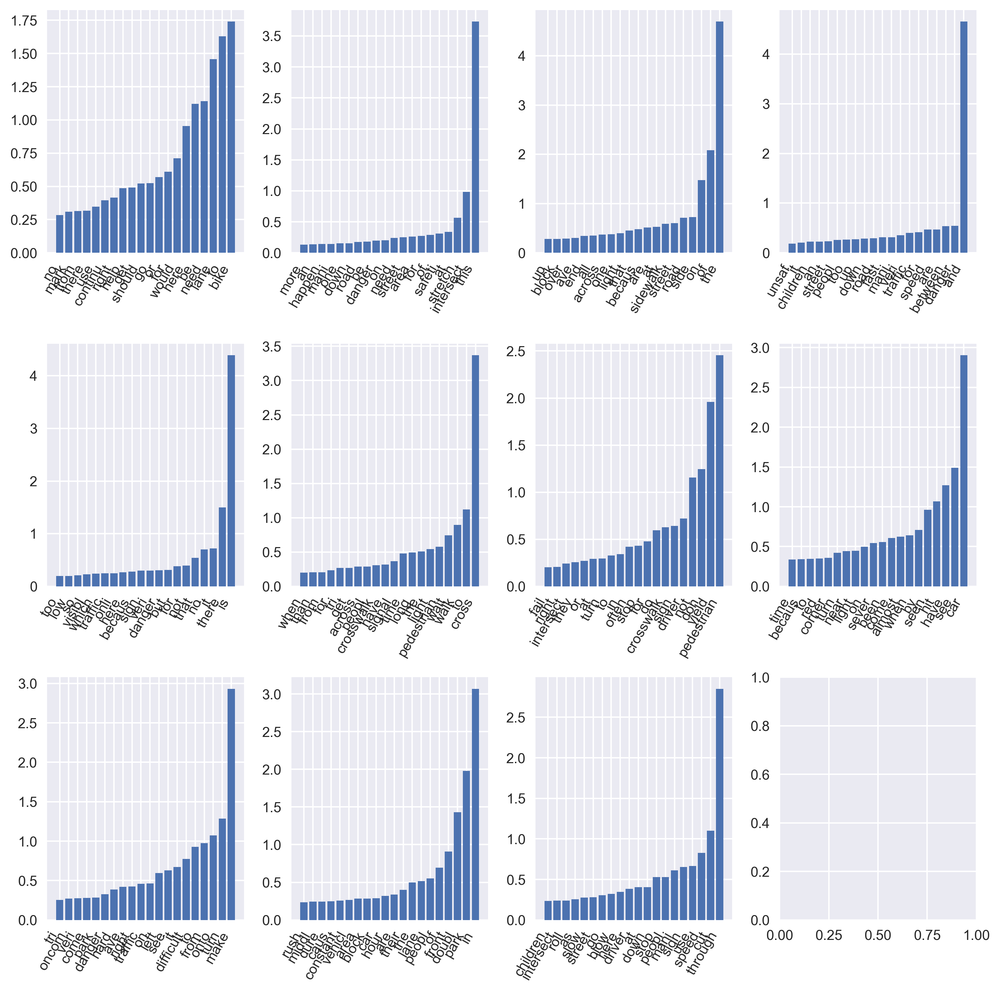

In [86]:
nmf_scale = NMF(n_components=11, verbose=10, tol=0.01).fit(X_scaled)
X_nmf_scale = nmf_scale.transform(X_scaled)


large_comp_inds = np.argsort(X_nmf_scale.mean(axis=0))[-12:][::-1]

feature_names = np.array(vect.named_steps['countvectorizer'].get_feature_names())
fig, axes = plt.subplots(3, 4, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), nmf_scale.components_[large_comp_inds, :]):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

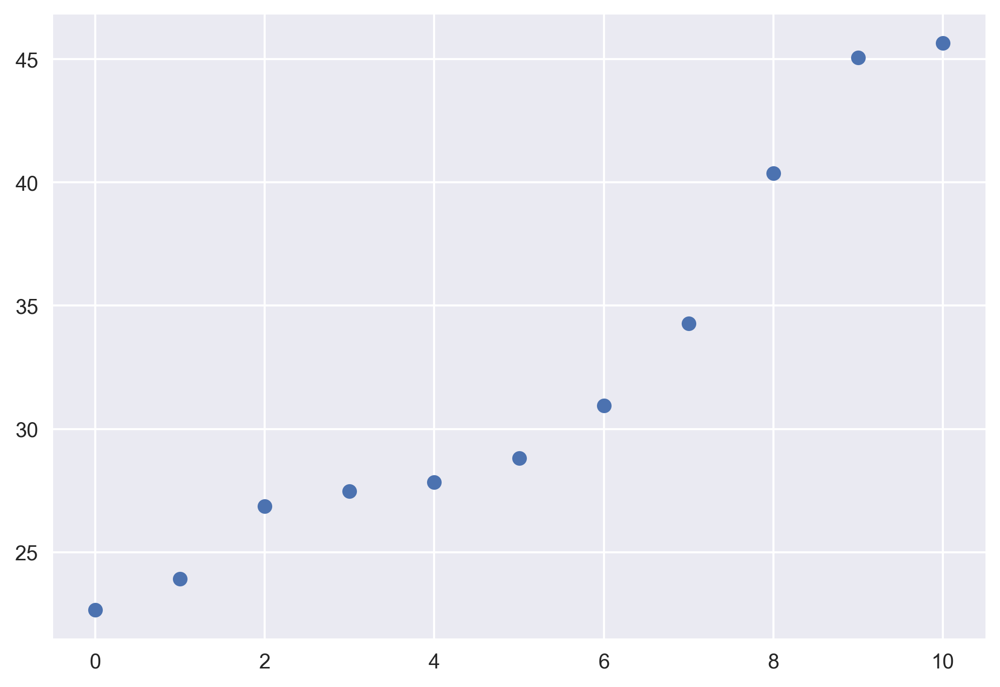

In [88]:
plt.plot(np.sort(nmf_scale.components_.sum(axis=1)), "o")

In [90]:
sorting = np.argsort(nmf_scale.components_, axis=1)[:, ::-1]
print_topics(large_comp_inds, feature_names, sorting)

topic 5       topic 2       topic 0       topic 9       topic 7       topic 1       
--------      --------      --------      --------      --------      --------      
purpos        everywher     legion        avenu         passeng       zoom          
wit           forget        sw            round         arlington     segment       
someon        pack          public        hous          decid         entireti      
huge          are           dcr           particular    bodi          occur         
somebodi      foot          provid        part          had           chicken       
grow          owner         protect       carlton       see           everyth       
entranc       buttonwood    prospect      parson        secur         dodg          
bright        own           debri         park          conflict      occas         
some          overpass      properti      aggress       section       complic       
appear        over          6pm           parallel      count    

#### NMF_tfidf

violation: 1.0
violation: 0.44612461552025356
violation: 0.28100235909746857
violation: 0.21452973211457022
violation: 0.18098598200788873
violation: 0.1463250583094341
violation: 0.11294716509540394
violation: 0.08929802709272534
violation: 0.07452017126583896
violation: 0.06346353813240901
violation: 0.05549240131422211
violation: 0.04874158212598661
violation: 0.043007542605496385
violation: 0.038879308292321266
violation: 0.03556437947675083
violation: 0.03292061073345632
violation: 0.030815261586350444
violation: 0.02896340781973577
violation: 0.02746919752182955
violation: 0.02585423222564944
violation: 0.024266393147917623
violation: 0.023014493081234794
violation: 0.022030092282513482
violation: 0.021193162017002082
violation: 0.020560076910316985
violation: 0.02019506558887461
violation: 0.020030858733704627
violation: 0.019975328412650994
violation: 0.019972781849656222
violation: 0.01996486375060515
violation: 0.01990877653355729
violation: 0.019732956000424434
violation: 0.

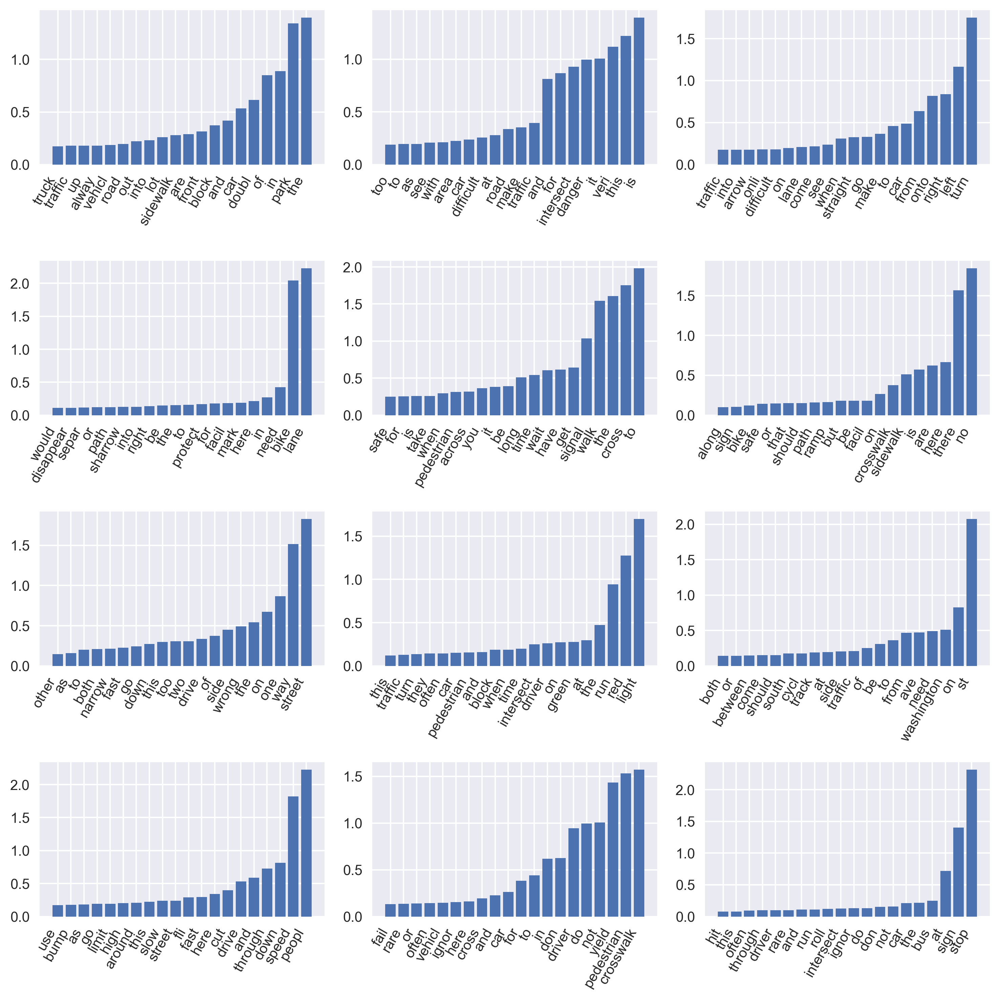

In [98]:
nmf_tfidf = NMF(n_components=12, verbose=10, tol=0.01).fit(X1)
X_nmf_tfidf = nmf_tfidf.transform(X1)
large_comp_inds = np.argsort(X_nmf_tfidf.mean(axis=0))[-12:][::-1]

feature_names = np.array(vect.named_steps['countvectorizer'].get_feature_names())
fig, axes = plt.subplots(4, 3, figsize=(10, 10))
for ax, coef in zip(axes.ravel(), nmf_tfidf.components_[large_comp_inds, :]):
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

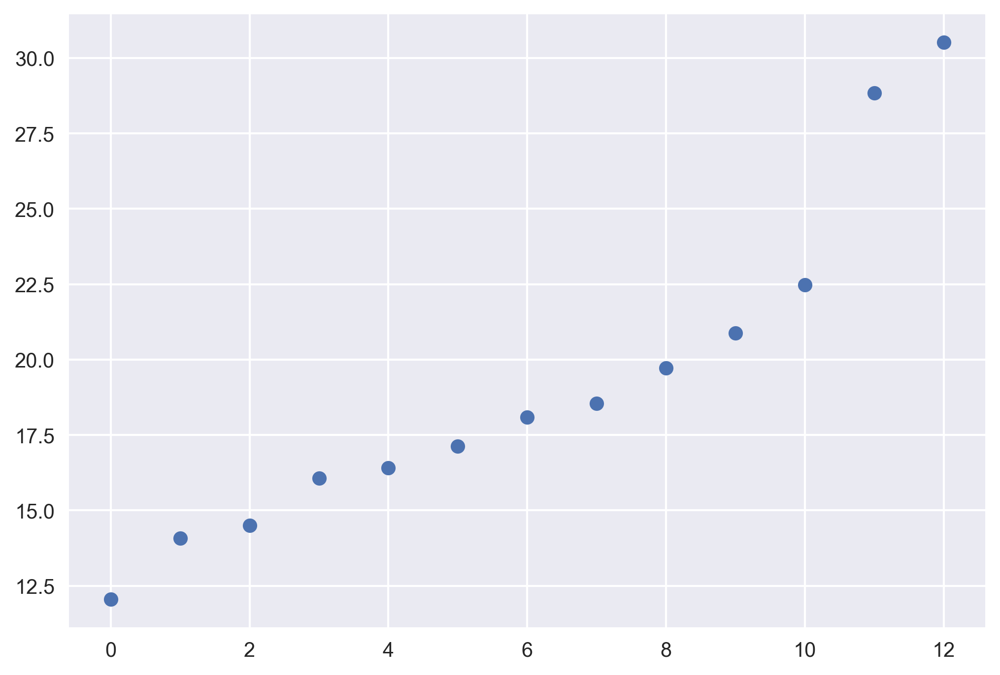

In [96]:
plt.plot(np.sort(nmf_tfidf.components_.sum(axis=1)), "o")

In [99]:
sorting = np.argsort(nmf_tfidf.components_, axis=1)[:, ::-1]
print_topics(large_comp_inds, feature_names, sorting)

topic 8       topic 6       topic 2       topic 1       topic 0       topic 9       
--------      --------      --------      --------      --------      --------      
zoom          rapid         intersect     plate         zoom          zoom          
adher         farther       tell          assum         therefor      bend          
found         someth        scari         side          help          doublepark    
reason        deliveri      scare         certain       impair        becom         
rear          sometim       say           shuttl        individu      milton        
realiz        somewher      saw           ice           drain         minor         
re            greenough     feet          hall          dunkin        melcher       
field         meridian      asphalt       shut          check         anyth         
ran           cell          savin         show          death         do            
caution       soon          6pm           shovel        25       

# Task6 - Model 3 [30 points]

Improve the class definition for REQUESTTYPE by using the results of the clustering and results of the previous classification model. Re-assign labels using either the results of clustering or using keywords that you found during data exploration. The labels must be semantically meaningful.
The data has a large “other” category. Apply the topic modeling and clustering techniques to this subset of the data to find possible splits of this class.
Report accuracy using macro average f1 score (should be above .53) 


### Relabel with k-means

In [153]:
from sklearn.pipeline import make_pipeline
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import adjusted_rand_score
from sklearn.cluster import KMeans
vect=make_pipeline(CountVectorizer(analyzer=stemmed_words,min_df=4,ngram_range=(1, 2)),TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True))

X1= vect.fit_transform(X)

km = KMeans(n_clusters=13,random_state=3)

km.fit(X1)
adjusted_rand_score(y, km.labels_)

0.14282727988091529

In [154]:
data_clean['newlabel']=km.labels_

In [155]:
np.unique(km.labels_)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int32)

In [156]:
km.labels_[0:20]

array([ 6,  3,  5,  2,  6,  6, 12,  6,  6,  0, 11,  8,  8,  8, 12,  6,  3,
        6, 11, 11], dtype=int32)

### classficiation

In [157]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

X_train_text, X_test_text, y_train, y_test = train_test_split(data_clean.COMMENTS, data_clean.newlabel, stratify = data_clean.newlabel, random_state = 0)

In [158]:
X_train = vect.transform(X_train_text)
X_test = vect.transform(X_test_text)

lr = LogisticRegression(C=10).fit(X_train, y_train)
y_pred = lr.predict(X_test)

f1_score_model_3 = f1_score(y_test, y_pred, average='macro')
f1_score_model_3

0.89978833478610376

### Visualize and Rename

In [172]:
km.cluster_centers_

array([[ 0.        ,  0.00054107,  0.00146226, ...,  0.        ,
         0.00074217,  0.00122362],
       [ 0.0015809 ,  0.00319701,  0.        , ...,  0.        ,
         0.00049291,  0.00056064],
       [ 0.00053965,  0.00166724,  0.        , ...,  0.        ,
         0.00410281,  0.00145142],
       ..., 
       [ 0.        ,  0.        ,  0.00253854, ...,  0.        ,
         0.00157992,  0.00068915],
       [ 0.00103729,  0.00082967,  0.00134989, ...,  0.00123302,
         0.01007387,  0.        ],
       [ 0.        ,  0.00167513,  0.        , ...,  0.00068851,
         0.00083377,  0.        ]])

In [173]:
km.cluster_centers_.shape

(13, 1831)

In [174]:
X_train.shape

(4842, 1831)

In [175]:
feature_names = np.array(vect.named_steps['countvectorizer'].get_feature_names())

In [176]:
np.mean(km.cluster_centers_.sum(axis=1))

4.1180609972426305

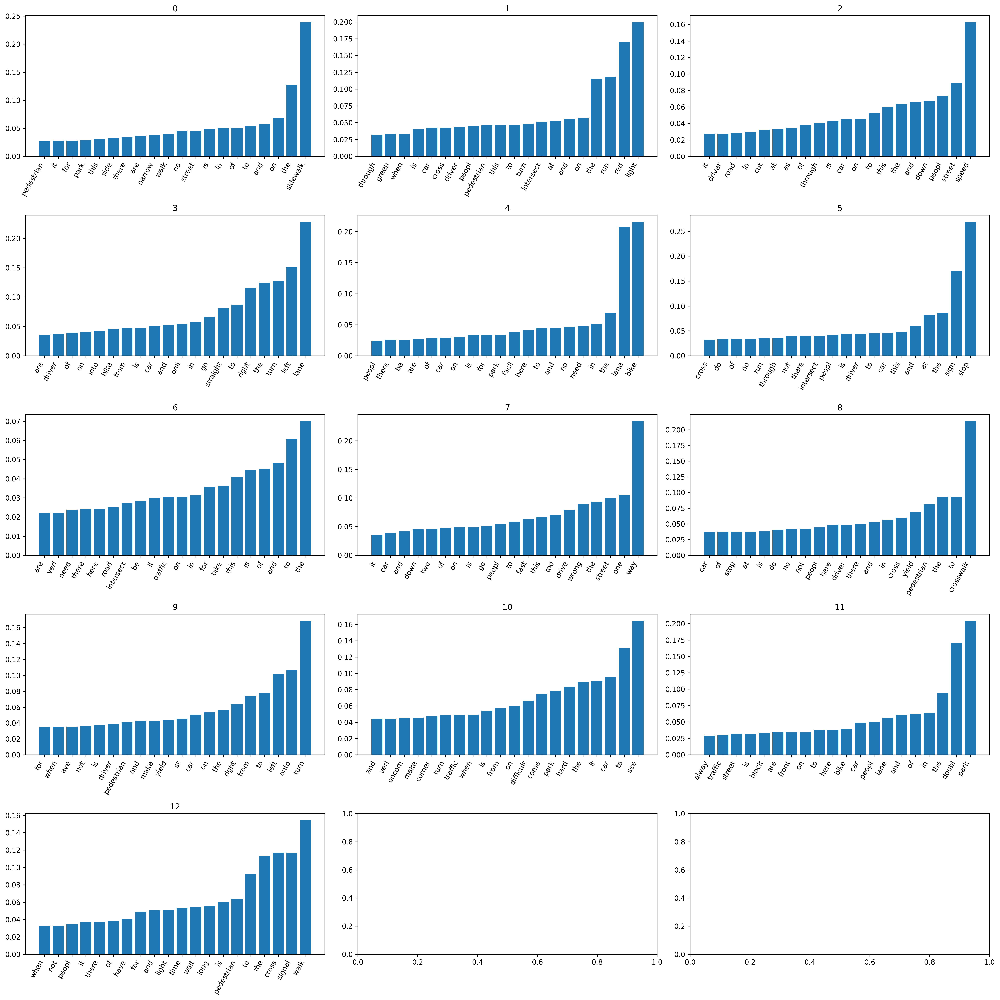

In [177]:
fig, axes = plt.subplots(5, 3, figsize=(20, 20))
i = 0
for ax, coef in zip(axes.ravel(), km.cluster_centers_):
    ax.set_title(i)
    i+=1
    plot_important_features(coef, feature_names, top_n=20, ax=ax)
    
plt.tight_layout()

Through the graphs, we can find those high-frequency words and recognize their themes. Here is our manually-picked names for all the labels, which is meanningful and also have intersection with the true ground labels.

km_labels | names/keywords
----------|-------
cluster 0 | sidewalks are too narrow or parked by cars
cluster 1 | signals for cars have conflicts with the pedestrains' (people are crossing while cars are turning right.)
cluster 2 | people speed
cluster 3 | cars run lights or drive in wrong lanes (or even bike lanes)
cluster 4 | need bike lanes
cluster 5 | people run stop signs
cluster 6 | dangerous intersections
cluster 7 | people drive in wrong direction on one-way street
cluster 8 | cars don't stop in front of the crosswalk with stop-sign
cluster 9 | cars don't yield pedestrain at the turning corner
cluster 10| hard to see
cluster 11| double park
cluster 12| people have to wait too long for the walk signal

In [188]:
# we check the content to match names by query as follows
X_test_text[y_pred == 9]

7552    At intersection of Storrow Dr & Revere St sign...
5812    Specifically, people driving north making a le...
971     Pedestrian/bicycle signal is poorly timed toge...
3815    Pedestrians ignore Don't Walk sign.  Drivers t...
60      Drivers making a right turn onto Storrow from ...
4236    Everyone thinks they have the right of way at ...
3297    Needs to be green arrow light & a red light on...
1247    There's no crosswalk to cross western ave here...
6137    People here go quickly and do not yield to ped...
837     people don't yield when coming down hill and t...
6461    Cars turning right off Park Drive onto Boylsto...
8053    Fix timing of lights at intersection Arborway ...
3726    Drivers frequently make illegal left turns ont...
4575    although it is posted as no turn on red, almos...
3619    Cars heading south on North St block the box w...
3725    Drivers turning left onto Harrison block the c...
1942    people who want to turn left onto austin do no...
42      Left t

##  Clustering on "Other" category

In [164]:
others_data=data_clean[data_clean.REQUESTTYPE=='of something that is not listed here']['COMMENTS']
others_data = pd.DataFrame(others_data)

In [165]:
vect=make_pipeline(CountVectorizer(analyzer=stemmed_words,min_df=4,ngram_range=(1, 2)),TfidfTransformer(norm='l2', smooth_idf=True, sublinear_tf=False, use_idf=True))

X1= vect.fit_transform(data_clean[data_clean.REQUESTTYPE=='of something that is not listed here']['COMMENTS'])

### Model 1: KMeans
#### pick the best k (numbers of clusters)

In [51]:
#### define stability function for KMeans

from sklearn.base import clone
from sklearn.utils import check_random_state

def cluster_stability(X, est, n_iter=20, random_state=None):
    labels = []
    indices = []
    rng = np.random.RandomState(6)
    for i in range(n_iter):
        # draw bootstrap samples, store indices
        sample_indices = rng.randint(0, X.shape[0], X.shape[0])
        indices.append(sample_indices)
        est = clone(est)
        if hasattr(est, "random_state"):
            # randomize estimator if possible
            est.random_state = rng.randint(1e5)
        X_bootstrap = X[sample_indices]
        est.fit(X_bootstrap)
        # store clustering outcome using original indices
        relabel = -np.ones(X.shape[0], dtype=np.int)
        relabel[sample_indices] = est.labels_
        labels.append(relabel)
    scores = []
    for l, i in zip(labels, indices):
        for k, j in zip(labels, indices):
            # we also compute the diagonal which is a bit silly
            in_both = np.intersect1d(i, j)
            scores.append(adjusted_rand_score(l[in_both], k[in_both]))
    return np.mean(scores)

In [54]:
#### Stability and silhouette plot
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples
from sklearn.metrics import adjusted_rand_score, silhouette_score
stability = []
silhouette = []
cluster_range = range(2, 13, 1)
for n_clusters in cluster_range:
    km = KMeans(n_clusters=n_clusters,random_state=3)
    stability.append(cluster_stability(X1, km))
    km.fit(X1)
    silhouette.append(silhouette_score(X1, km.labels_))

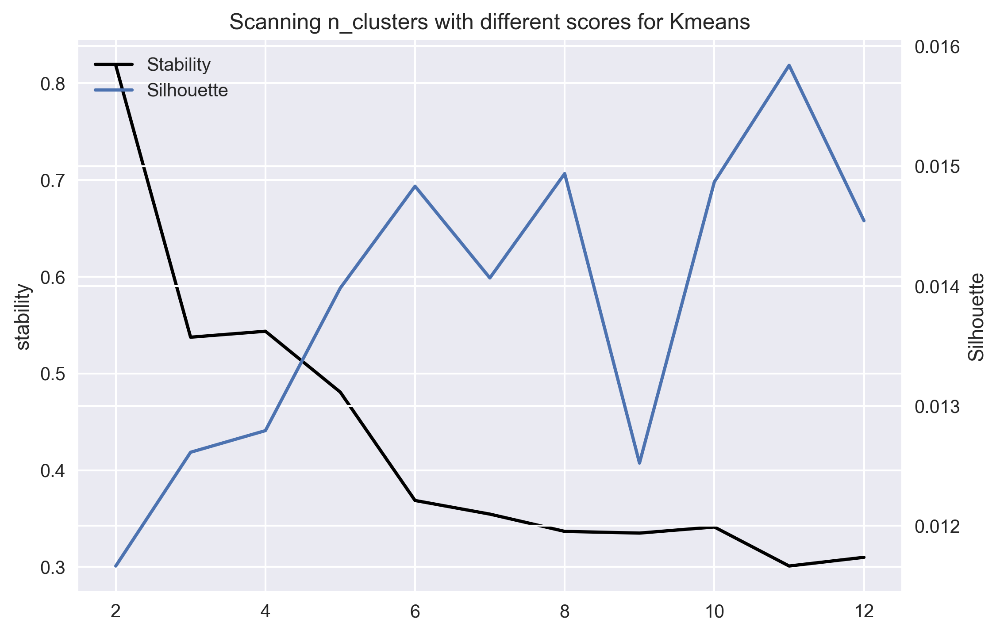

In [55]:
st, = plt.plot(cluster_range, stability, label="stability", c='k')
plt.ylabel("stability")

si, = plt.twinx().plot(cluster_range, silhouette, label="silhouette")
plt.ylabel("Silhouette")


plt.legend([st, si], ["Stability", "Silhouette"])
plt.xlabel("n_clusters")
plt.title("Scanning n_clusters with different scores for Kmeans")

In [168]:
###### k = 6 ####
km6 = KMeans(n_clusters=6,random_state=3)
km6.fit(X1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=3, tol=0.0001, verbose=0)

In [169]:
others_data['newlabel']=km6.labels_

In [170]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
X_train_text, X_test_text, y_train, y_test = train_test_split(others_data.COMMENTS, others_data.newlabel, stratify = others_data.newlabel, random_state = 0)

In [171]:
from sklearn.linear_model import LogisticRegression
X_train = vect.transform(X_train_text)
X_test = vect.transform(X_test_text)
lr = LogisticRegression().fit(X_train, y_train)
y_pred = lr.predict(X_test)
f1_score(y_test, y_pred, average='macro')

0.87520774429740644

In [172]:
###### k = 8 ####
km8 = KMeans(n_clusters=8,random_state=3)
km8.fit(X1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=3, tol=0.0001, verbose=0)

In [173]:
others_data['newlabel']=km8.labels_

In [179]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
X_train_text, X_test_text8, y_train, y_test = train_test_split(others_data.COMMENTS, others_data.newlabel, stratify = others_data.newlabel, random_state = 0)

In [180]:
from sklearn.linear_model import LogisticRegression
X_train = vect.transform(X_train_text)
X_test = vect.transform(X_test_text8)
lr = LogisticRegression().fit(X_train, y_train)
y_pred8 = lr.predict(X_test)
f1_score(y_test, y_pred8, average='macro')

0.87988204012368731

We decided to pick 8 since it has second high silhouette score and a higher test score compared to n=6.
### NMF dfidf
As what we got before, the nmf-dfidf has higher ari score than nmf-scale, so for the "other" dataset, we decide to implement nmf-dfidf directly.

In [125]:
from sklearn.base import clone
from sklearn.utils import check_random_state

def cluster_stability(X, est, n_iter=20, random_state=None):
    labels = []
    indices = []
    rng = np.random.RandomState(6)
    for i in range(n_iter):
        # draw bootstrap samples, store indices
        sample_indices = rng.randint(0, X.shape[0], X.shape[0])
        indices.append(sample_indices)
        est = clone(est)
        if hasattr(est, "random_state"):
            # randomize estimator if possible
            est.random_state = rng.randint(1e5)
        X_bootstrap = X[sample_indices]
        a=est.fit_transform(X_bootstrap)
        # store clustering outcome using original indices
        relabel = -np.ones(X.shape[0], dtype=np.int)
        relabel[sample_indices] = a.argmax(axis=1)
        labels.append(relabel)
    scores = []
    for l, i in zip(labels, indices):
        for k, j in zip(labels, indices):
            # we also compute the diagonal which is a bit silly
            in_both = np.intersect1d(i, j)
            scores.append(adjusted_rand_score(l[in_both], k[in_both]))
    return np.mean(scores)

In [127]:
from sklearn.decomposition import NMF

stability1 = []
silhouette1 = []
cluster_range1 = range(2, 15, 1)
for n_clusters in cluster_range1:
    nmf=NMF(n_components=n_clusters, verbose=10, tol=0.01,random_state=3)
    stability1.append(cluster_stability(X1, nmf))
    nmf_result=nmf.fit_transform(X1)
    silhouette1.append(silhouette_score(X1, nmf_result.argmax(axis=1)))

violation: 1.0
violation: 0.6827476619835761
violation: 0.4454007500905014
violation: 0.3339539174591644
violation: 0.2596173537638356
violation: 0.20968781014218857
violation: 0.16717612512789662
violation: 0.13630574521933586
violation: 0.1124498523735605
violation: 0.09263053418931415
violation: 0.07703892859518204
violation: 0.0647323258792632
violation: 0.05455156281468857
violation: 0.04568863828961127
violation: 0.037608438557571594
violation: 0.030557480104460286
violation: 0.02502396447149841
violation: 0.02065349456983307
violation: 0.01711404176951932
violation: 0.014226036361706997
violation: 0.011850287195931066
violation: 0.009885492402712637
Converged at iteration 22
violation: 1.0
violation: 0.69176898065865
violation: 0.4586017168887078
violation: 0.32600713130843373
violation: 0.241965746776427
violation: 0.18651291114601687
violation: 0.1472378835261741
violation: 0.11792338980755941
violation: 0.09485992747050555
violation: 0.07659634526646142
violation: 0.061585649

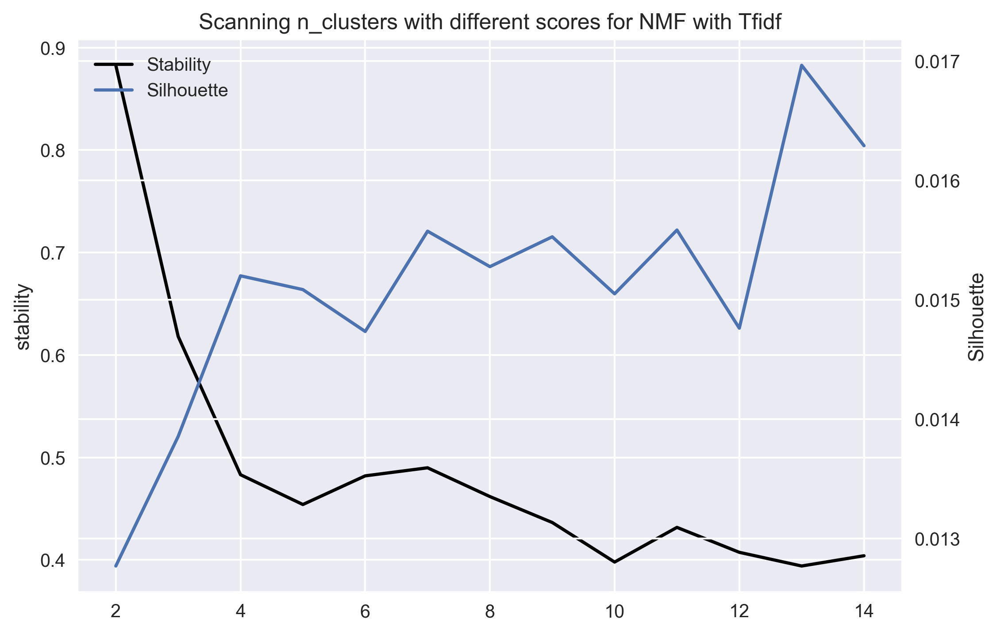

In [128]:
st, = plt.plot(cluster_range1, stability1, label="stability", c='k')
plt.ylabel("stability")

si, = plt.twinx().plot(cluster_range1, silhouette1, label="silhouette")
plt.ylabel("Silhouette")


plt.legend([st, si], ["Stability", "Silhouette"])
plt.xlabel("n_clusters")
plt.title("Scanning n_clusters with different scores for NMF with Tfidf")

In [140]:
nmf_final=NMF(n_components=13,verbose=10, tol=0.01,random_state=3)
nmf_result=nmf_final.fit_transform(X1)

violation: 1.0
violation: 0.4002542265867236
violation: 0.24156182883414146
violation: 0.1727588401493319
violation: 0.14055726253216233
violation: 0.12632218056569103
violation: 0.12029491431355219
violation: 0.11743093073566259
violation: 0.11398153153301772
violation: 0.10701006837877577
violation: 0.09978271812055081
violation: 0.09476366383373007
violation: 0.08962404022135201
violation: 0.08334546148017628
violation: 0.07665464885117074
violation: 0.06998651301124077
violation: 0.06326986490043555
violation: 0.05716170900088775
violation: 0.051925265141980564
violation: 0.04765807765368076
violation: 0.04393191014137627
violation: 0.04079265619064841
violation: 0.03806743852207203
violation: 0.03560585183845336
violation: 0.033805184538585886
violation: 0.03219919813985835
violation: 0.030765552223571347
violation: 0.029817307394733775
violation: 0.029036206199905927
violation: 0.028551112912253568
violation: 0.028297924530765354
violation: 0.028284938212081445
violation: 0.02845

In [141]:
others_data['newlabel_NMF']=nmf_result.argmax(axis=1)   

In [142]:
X_train_text, X_test_text, y_train, y_test = train_test_split(others_data.COMMENTS, others_data.newlabel_NMF, stratify = others_data.newlabel_NMF, random_state = 0)

In [143]:
X_train= vect.transform(X_train_text)
X_test = vect.transform(X_test_text)
lr = LogisticRegression().fit(X_train, y_train)
y_pred = lr.predict(X_test)
f1_score(y_test, y_pred, average='macro')

0.81953099478267066

As we compared NMF with Tfidf and Kmeans f1 scores on test dataset (i.e. 0.8195 vs 0.8868), we found that kmeans with 8 clusters has the better score.  Thus, we decided to use the Kmeans with 8 clusters algorithm. 

Further we would visualize its topics and rename the sub-topics in "other" category.

### topics distribution in "other" category

In [146]:
feature_names_kmeans = np.array(vect.named_steps['countvectorizer'].get_feature_names())

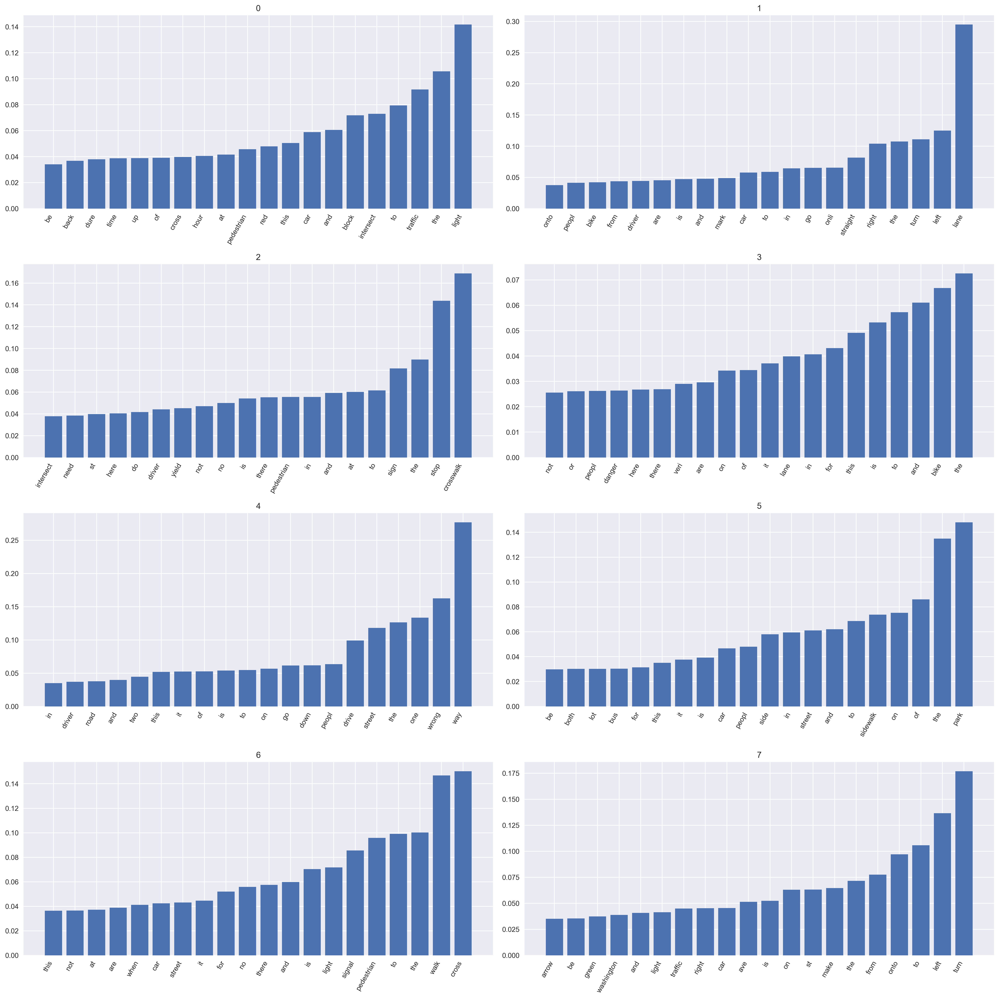

In [148]:
fig, axes = plt.subplots(4, 2, figsize=(20, 20))
i = 0
for ax, coef in zip(axes.ravel(), km.cluster_centers_):
    ax.set_title(i)
    i+=1
    plot_important_features(coef, feature_names_kmeans, top_n=20, ax=ax)
    
plt.tight_layout()

We can generally name the subgroup in "other" category as follows:

km_labels | names/keywords
----------|-------
cluster 0 | people run lights in rush hours
cluster 1 | lane marks need improvement
cluster 2 | cars do not stop for pedestrians in the crosswalk
cluster 3 | all kinds of vehicle makes here dangerous
cluster 4 | drive in the wrong way
cluster 5 | sidewalk need improvement
cluster 6 | no walk signal at this crosswalk/ people don't yield to pedestrians
cluster 7 | cars' signal and pedestrain signal have conflicts at intersection

In [189]:
X_test_text8[y_pred8 == 0]

3666    Traffic that is outbound on Huntington uses this corner to reverse direction during the pedestrian light.                                                                                                                                                 
6248    Double-length silver line buses frequently run red lights on Washington and/or block the entire intersection.                                                                                                                                             
5072    timing of traffic lights needs to be addressed. Cars regularly, even at non-peak times, back up past BHCC and into Charlestown, leaving cars to block the box and blocking views of pedestrians crossing.                                                 
1424    Cars block box not allowing silver line to go through                                                                                                                                                                  

# Extra Credit [Up to +20 points]

Use a word embedding representation like word2vec for step 3 and or step 6. 

### word2vec (for step 3)

In [1]:
# from gensim import models
# w = models.KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)

In [7]:
# from sklearn.model_selection import train_test_split
# X_train_text, X_test_text, y_train, y_test = train_test_split(data_clean.COMMENTS, data_clean.REQUESTTYPE, stratify = data_clean.REQUESTTYPE, random_state = 0)

In [9]:
# from sklearn.feature_extraction.text import CountVectorizer
# vect_w2v = CountVectorizer(vocabulary=w.index2word)
# vect_w2v.fit(X_train_text)
# docs = vect_w2v.inverse_transform(vect_w2v.transform(X_train_text))
# docs[0]

array(['at', 'are', 'there', 'no', 'along', 'cars', 'posted', 'speed',
       'limits', 'frequently', 'excessive', 'speeds'], 
      dtype='<U98')

In [10]:
# X_train = []
# for doc in docs:
#     wordsum = []
#     for word in doc:
#         wordsum.append(w[word])
#     X_train.append(np.mean(wordsum))
# docs_val = vect_w2v.inverse_transform(vect_w2v.transform(X_test_text))

# X_test = []
# for doc in docs_val:
#     wordsum = []
#     for word in doc:
#         wordsum.append(w[word])
#     X_test.append(np.mean(wordsum))

/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/numpy/core/fromnumeric.py:2889: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [12]:
# from sklearn.linear_model import LogisticRegression
# X_test = pd.DataFrame(X_test)
# X_train = pd.DataFrame(X_train)
# X_train.fillna(X_train.mean(), inplace=True)
# X_test.fillna(X_test.mean(), inplace=True)
# lr_w2v = LogisticRegression(C=10).fit(X_train, y_train)
# lr_w2v.score(X_train, y_train)

0.21685254027261464

In [14]:
# from sklearn.metrics import f1_score
# y_pred = lr_w2v.predict(X_test)
# f1_score(y_test, y_pred, average='macro')

/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


0.025445292620865138

### word2vec (for step 6 - relabeled by kmeans(k=8))

In [51]:
# from gensim import models
# w = models.KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)

In [139]:
# vect_w2v = CountVectorizer(vocabulary=w.index2word)
# vect_w2v.fit(X_train_text)
# docs = vect_w2v.inverse_transform(vect_w2v.transform(X_train_text))
# docs[0]

array(['for', 'on', 'the', 'not', 'have', 'they', 'do', 'when', 'way',
       'during', 'right', 'run', 'stop', 'hour', 'red', 'cross', 'drivers',
       'lights', 'rush', 'pedestrians', 'bikers'], 
      dtype='<U98')

In [140]:
# X_train = []
# for doc in docs:
#     wordsum = []
#     for word in doc:
#         wordsum.append(w[word])
#     X_train.append(np.mean(wordsum))

In [141]:
# docs_val = vect_w2v.inverse_transform(vect_w2v.transform(X_test_text))

In [142]:
# X_test = []
# for doc in docs_val:
#     wordsum = []
#     for word in doc:
#         wordsum.append(w[word])
#     X_test.append(np.mean(wordsum))

/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/numpy/core/fromnumeric.py:2889: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [158]:
# X_test = pd.DataFrame(X_test)
# X_train = pd.DataFrame(X_train)

In [159]:
# X_train.fillna(X_train.mean(), inplace=True)
# X_test.fillna(X_test.mean(), inplace=True)

,0
0,-0.004936
1,0.001386
2,-0.005078
3,-0.004298
4,-0.001512
5,-0.005189
6,-0.006740
7,-0.003226
8,-0.001062
9,-0.004118


In [165]:
# lr_w2v = LogisticRegression(C=10).fit(X_train, y_train)
# lr_w2v.score(X_train, y_train)

0.2244940107393639

In [162]:
# y_pred = lr_w2v.predict(X_test)
# f1_score(y_test, y_pred, average='macro')

/Library/Frameworks/Python.framework/Versions/3.4/lib/python3.4/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


0.026157959390129343

# Travis

In [149]:
assert f1_score_model_1 > 0.53

In [150]:
assert f1_score_model_2 > 0.55

In [159]:
assert f1_score_model_3 > 0.85